<a href="https://colab.research.google.com/github/thalicsouza/marketing_segmentation/blob/main/Case_Marketing_Segmention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Case study | Data Scientist

Situation: "The marketing manager call you. You are provided with the below dataset and asked to figure out who/how we can target with a new marketing campaign. You may use any statistical or non|statistical approach to achieve this.
Your solution can consist of:
* Some basic explanatory analysis of the data
* Any feature engineering you may wish to do e.g. derived variables
* A basic interpretation of any analysis you carry out
* A machine learning techniques/model
* Thoughts on what would you add given more time and what further questions you would ask the marketing manager



### Data dictionary:

|Variable|Description|
|--------|-----------|
#user_id | unique identifier of our customers
#prod_id | unique identifier of the product
#sex | F-female, M-male sex
#age_cat | customer age category
#credit_status_cd | determine the credit status code 0-20. These are internal codes with no further explanation.
#education_cat | education category (high-school degree,undergrad of high school, university/college degree)
#years_in_residence | how many years customer stayed at current residence i.e. 1,2,3, 4+ years
#car_ownership | flag of car ownership
#prod_cat_1 | product category class 1 (internal product category classification)
#prod_cat_2 | product category class 2 (internal product category classification)
#prod_cat_3 | product category class 3 (internal product category classification)
#revenue_usd | total revenue purchase

### Initial Configuration

In [ ]:
# installing packages and libs
!pip install pycaret
!pip install shap
!pip install pycaret[analysis]
!pip install pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 483.9/483.9 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 43.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 14.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 63.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 70.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 78.0 MB/s eta 0:

In [4]:
# importing necessary libs
print("Importing libs...")
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from zipfile import ZipFile
from pycaret.classification import *
from ipywidgets import widgets
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
print("Ok")

Importing libs...
Ok


In [ ]:
# creating a new folder
!mkdir data
print("OK!")

OK!


In [ ]:
# data upload
print("Extracting files...")
zip = ZipFile('/content/data/case_study-20230928T170127Z-001.zip')
zip.extractall()
print("OK!")

Extracting files...
OK!


In [5]:
# reading the data frames
df1 = pd.read_csv("/content/case_study/customer-spending-1.csv")
df1.drop_duplicates(inplace=True)
print(df1.info())
df1.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200000 entries, 0 to 199999
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             200000 non-null  object 
 1   prod_id             200000 non-null  object 
 2   sex                 200000 non-null  object 
 3   age_cat             200000 non-null  object 
 4   credit_status_cd    200000 non-null  int64  
 5   edcution_cat        200000 non-null  object 
 6   years_in_residence  200000 non-null  object 
 7   car_ownership       200000 non-null  int64  
 8   prod_cat_1          200000 non-null  int64  
 9   prod_cat_2          138024 non-null  float64
 10  prod_cat_3          61304 non-null   float64
 11  revenue_usd         200000 non-null  float64
dtypes: float64(3), int64(3), object(6)
memory usage: 19.8+ MB
None


,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd
0,DCN-1000001,DSKU-P00069042,F,18-25,10,university,2,0,3,NaN,NaN,9847.06
1,DCN-1000001,DSKU-P00248942,F,18-25,10,university,2,0,1,6.0,14.0,17882.35
2,DCN-1000001,DSKU-P00087842,F,18-25,10,university,2,0,12,NaN,NaN,1672.94
3,DCN-1000001,DSKU-P00085442,F,18-25,10,university,2,0,12,14.0,NaN,1243.53
4,DCN-1000002,DSKU-P00285442,M,55+,16,high,4+,0,8,NaN,NaN,9375.29


In [6]:
# reading the data frames
df2 = pd.read_csv("/content/case_study/customer-spending-2.csv")
df2.drop_duplicates(inplace=True)
print(df2.info())
df2.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200000 entries, 0 to 199999
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             200000 non-null  object 
 1   prod_id             200000 non-null  object 
 2   sex                 200000 non-null  object 
 3   age_cat             200000 non-null  object 
 4   credit_status_cd    200000 non-null  int64  
 5   edcution_cat        200000 non-null  object 
 6   years_in_residence  200000 non-null  object 
 7   car_ownership       200000 non-null  int64  
 8   prod_cat_1          200000 non-null  int64  
 9   prod_cat_2          137961 non-null  float64
 10  prod_cat_3          61139 non-null   float64
 11  revenue_usd         200000 non-null  float64
dtypes: float64(3), int64(3), object(6)
memory usage: 19.8+ MB
None


,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd
0,DCN-1000899,DSKU-P00053842,F,26-35,1,under-high,3,1,4,5.0,12.0,1730.59
1,DCN-1000899,DSKU-P00161942,F,26-35,1,under-high,3,1,5,8.0,NaN,8410.59
2,DCN-1000899,DSKU-P00329442,F,26-35,1,under-high,3,1,5,8.0,NaN,8238.82
3,DCN-1000899,DSKU-P00031042,F,26-35,1,under-high,3,1,8,NaN,NaN,9463.53
4,DCN-1000899,DSKU-P00010742,F,26-35,1,under-high,3,1,1,8.0,17.0,22858.82


In [7]:
# reading the data frames
df3 = pd.read_csv("/content/case_study/customer-spending-3.csv")
df3.drop_duplicates(inplace=True)
print(df3.info())
df3.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 137577 entries, 0 to 137576
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             137577 non-null  object 
 1   prod_id             137577 non-null  object 
 2   sex                 137577 non-null  object 
 3   age_cat             137577 non-null  object 
 4   credit_status_cd    137577 non-null  int64  
 5   edcution_cat        137577 non-null  object 
 6   years_in_residence  137577 non-null  object 
 7   car_ownership       137577 non-null  int64  
 8   prod_cat_1          137577 non-null  int64  
 9   prod_cat_2          94606 non-null   float64
 10  prod_cat_3          41835 non-null   float64
 11  revenue_usd         137577 non-null  float64
dtypes: float64(3), int64(3), object(6)
memory usage: 13.6+ MB
None


,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd
0,DCN-1001560,DSKU-P00328442,F,26-35,3,under-high,2,0,5,14.0,NaN,8103.53
1,DCN-1001560,DSKU-P00347642,F,26-35,3,under-high,2,0,1,6.0,NaN,4509.41
2,DCN-1001560,DSKU-P00296042,F,26-35,3,under-high,2,0,8,13.0,16.0,5002.35
3,DCN-1001560,DSKU-P00350942,F,26-35,3,under-high,2,0,3,4.0,5.0,15738.82
4,DCN-1001560,DSKU-P00090942,F,26-35,3,under-high,2,0,1,2.0,14.0,22872.94


In [8]:
# concatenating the dataframes
df = pd.concat([df1,df2,df3], ignore_index=True)
df.drop_duplicates(inplace=True)
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 537577 entries, 0 to 537576
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             537577 non-null  object 
 1   prod_id             537577 non-null  object 
 2   sex                 537577 non-null  object 
 3   age_cat             537577 non-null  object 
 4   credit_status_cd    537577 non-null  int64  
 5   edcution_cat        537577 non-null  object 
 6   years_in_residence  537577 non-null  object 
 7   car_ownership       537577 non-null  int64  
 8   prod_cat_1          537577 non-null  int64  
 9   prod_cat_2          370591 non-null  float64
 10  prod_cat_3          164278 non-null  float64
 11  revenue_usd         537577 non-null  float64
dtypes: float64(3), int64(3), object(6)
memory usage: 53.3+ MB
None


,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd
0,DCN-1000001,DSKU-P00069042,F,18-25,10,university,2,0,3,NaN,NaN,9847.06
1,DCN-1000001,DSKU-P00248942,F,18-25,10,university,2,0,1,6.0,14.0,17882.35
2,DCN-1000001,DSKU-P00087842,F,18-25,10,university,2,0,12,NaN,NaN,1672.94
3,DCN-1000001,DSKU-P00085442,F,18-25,10,university,2,0,12,14.0,NaN,1243.53
4,DCN-1000002,DSKU-P00285442,M,55+,16,high,4+,0,8,NaN,NaN,9375.29


## Data transformation
- missing values
- incorrect data
- checking data types

In [ ]:
# Generate the Profiling Report
profile = ProfileReport(
    df, title="Orders & Clients", html={"style": {"full_width": True}}, sort=None
)
profile.to_widgets()
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
# correcting missing values
df.isna().sum()

user_id                    0
prod_id                    0
sex                        0
age_cat                    0
credit_status_cd           0
edcution_cat               0
years_in_residence         0
car_ownership              0
prod_cat_1                 0
prod_cat_2            166986
prod_cat_3            373299
revenue_usd                0
dtype: int64

In [10]:
# I decided to input N/A to replace the missing values. Reasons:
# Both columns with missing values are belongs to categorical variables
# Don't want to give these missing values some importance during the model training, so I'm going to aggregate them into a new categorie
df.fillna('N/A', inplace=True)
df.isna().sum()

user_id               0
prod_id               0
sex                   0
age_cat               0
credit_status_cd      0
edcution_cat          0
years_in_residence    0
car_ownership         0
prod_cat_1            0
prod_cat_2            0
prod_cat_3            0
revenue_usd           0
dtype: int64

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 537577 entries, 0 to 537576
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             537577 non-null  object 
 1   prod_id             537577 non-null  object 
 2   sex                 537577 non-null  object 
 3   age_cat             537577 non-null  object 
 4   credit_status_cd    537577 non-null  int64  
 5   edcution_cat        537577 non-null  object 
 6   years_in_residence  537577 non-null  object 
 7   car_ownership       537577 non-null  int64  
 8   prod_cat_1          537577 non-null  int64  
 9   prod_cat_2          537577 non-null  object 
 10  prod_cat_3          537577 non-null  object 
 11  revenue_usd         537577 non-null  float64
dtypes: float64(1), int64(3), object(8)
memory usage: 53.3+ MB


In [12]:
# I'm going also transform the prod_cat_1 and credit_status_cd into string, because it's a categorical variable
df['prod_cat_1'] = df['prod_cat_1'].astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 537577 entries, 0 to 537576
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             537577 non-null  object 
 1   prod_id             537577 non-null  object 
 2   sex                 537577 non-null  object 
 3   age_cat             537577 non-null  object 
 4   credit_status_cd    537577 non-null  int64  
 5   edcution_cat        537577 non-null  object 
 6   years_in_residence  537577 non-null  object 
 7   car_ownership       537577 non-null  int64  
 8   prod_cat_1          537577 non-null  object 
 9   prod_cat_2          537577 non-null  object 
 10  prod_cat_3          537577 non-null  object 
 11  revenue_usd         537577 non-null  float64
dtypes: float64(1), int64(2), object(9)
memory usage: 53.3+ MB


In [13]:
df['prod_cat_1'] = df['prod_cat_1'] + "x"
df.head()

,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd
0,DCN-1000001,DSKU-P00069042,F,18-25,10,university,2,0,3x,N/A,N/A,9847.06
1,DCN-1000001,DSKU-P00248942,F,18-25,10,university,2,0,1x,6.0,14.0,17882.35
2,DCN-1000001,DSKU-P00087842,F,18-25,10,university,2,0,12x,N/A,N/A,1672.94
3,DCN-1000001,DSKU-P00085442,F,18-25,10,university,2,0,12x,14.0,N/A,1243.53
4,DCN-1000002,DSKU-P00285442,M,55+,16,high,4+,0,8x,N/A,N/A,9375.29


In [14]:
df['credit_status_cd'] = df['credit_status_cd'].astype(str)
df['credit_status_cd'] = df['credit_status_cd'] + "x"
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 537577 entries, 0 to 537576
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             537577 non-null  object 
 1   prod_id             537577 non-null  object 
 2   sex                 537577 non-null  object 
 3   age_cat             537577 non-null  object 
 4   credit_status_cd    537577 non-null  object 
 5   edcution_cat        537577 non-null  object 
 6   years_in_residence  537577 non-null  object 
 7   car_ownership       537577 non-null  int64  
 8   prod_cat_1          537577 non-null  object 
 9   prod_cat_2          537577 non-null  object 
 10  prod_cat_3          537577 non-null  object 
 11  revenue_usd         537577 non-null  float64
dtypes: float64(1), int64(1), object(10)
memory usage: 53.3+ MB


In [15]:
df.head()

,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd
0,DCN-1000001,DSKU-P00069042,F,18-25,10x,university,2,0,3x,N/A,N/A,9847.06
1,DCN-1000001,DSKU-P00248942,F,18-25,10x,university,2,0,1x,6.0,14.0,17882.35
2,DCN-1000001,DSKU-P00087842,F,18-25,10x,university,2,0,12x,N/A,N/A,1672.94
3,DCN-1000001,DSKU-P00085442,F,18-25,10x,university,2,0,12x,14.0,N/A,1243.53
4,DCN-1000002,DSKU-P00285442,M,55+,16x,high,4+,0,8x,N/A,N/A,9375.29


In [16]:
# transforming car_ownership into string
map_car = {1:'Y', 0:'N'}
df['car_ownership'] = df['car_ownership'].map(map_car)
df.head()

,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd
0,DCN-1000001,DSKU-P00069042,F,18-25,10x,university,2,N,3x,N/A,N/A,9847.06
1,DCN-1000001,DSKU-P00248942,F,18-25,10x,university,2,N,1x,6.0,14.0,17882.35
2,DCN-1000001,DSKU-P00087842,F,18-25,10x,university,2,N,12x,N/A,N/A,1672.94
3,DCN-1000001,DSKU-P00085442,F,18-25,10x,university,2,N,12x,14.0,N/A,1243.53
4,DCN-1000002,DSKU-P00285442,M,55+,16x,high,4+,N,8x,N/A,N/A,9375.29


### EDA

In [17]:
# checking
df.describe().T

,count,mean,std,min,25%,50%,75%,max
revenue_usd,537577.0,10981.011587,5860.026037,217.65,6901.18,9484.71,14203.53,28189.41


In [18]:
# create a column with average ticket information
df.head()

,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd
0,DCN-1000001,DSKU-P00069042,F,18-25,10x,university,2,N,3x,N/A,N/A,9847.06
1,DCN-1000001,DSKU-P00248942,F,18-25,10x,university,2,N,1x,6.0,14.0,17882.35
2,DCN-1000001,DSKU-P00087842,F,18-25,10x,university,2,N,12x,N/A,N/A,1672.94
3,DCN-1000001,DSKU-P00085442,F,18-25,10x,university,2,N,12x,14.0,N/A,1243.53
4,DCN-1000002,DSKU-P00285442,M,55+,16x,high,4+,N,8x,N/A,N/A,9375.29


In [19]:
# creating a column to count each order
df['total_orders'] = 1
df.head()

,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd,total_orders
0,DCN-1000001,DSKU-P00069042,F,18-25,10x,university,2,N,3x,N/A,N/A,9847.06,1
1,DCN-1000001,DSKU-P00248942,F,18-25,10x,university,2,N,1x,6.0,14.0,17882.35,1
2,DCN-1000001,DSKU-P00087842,F,18-25,10x,university,2,N,12x,N/A,N/A,1672.94,1
3,DCN-1000001,DSKU-P00085442,F,18-25,10x,university,2,N,12x,14.0,N/A,1243.53,1
4,DCN-1000002,DSKU-P00285442,M,55+,16x,high,4+,N,8x,N/A,N/A,9375.29,1


In [57]:
df.describe()

,revenue_usd,total_orders
count,537577.000000,537577.0
mean,10981.011587,1.0
std,5860.026037,0.0
min,217.650000,1.0
25%,6901.180000,1.0
50%,9484.710000,1.0
75%,14203.530000,1.0
max,28189.410000,1.0


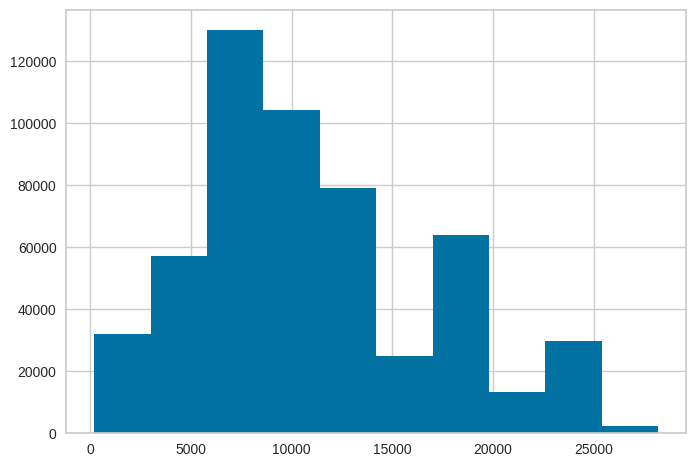

In [55]:
# ploting the ditribution of revenue
df['revenue_usd'].hist(bins=10);

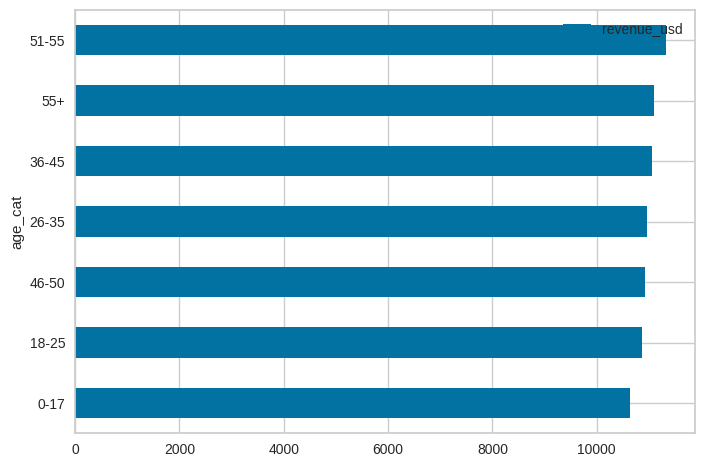

In [56]:
df.groupby('age_cat')['revenue_usd'].mean().sort_values().plot(kind='barh', legend=True);

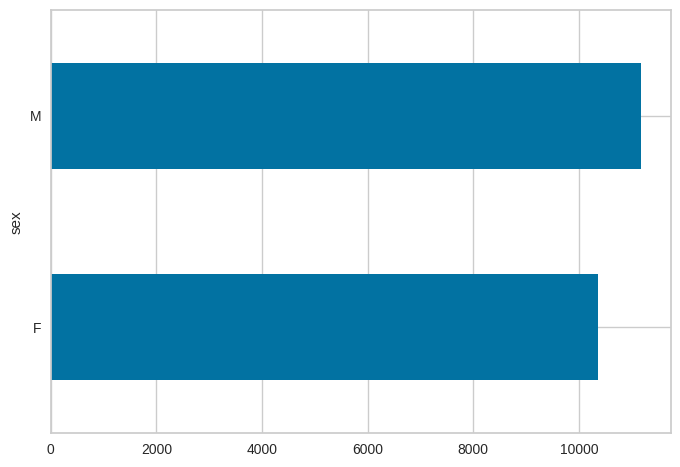

In [ ]:
df.groupby('sex')['revenue_usd'].mean().plot(kind='barh');

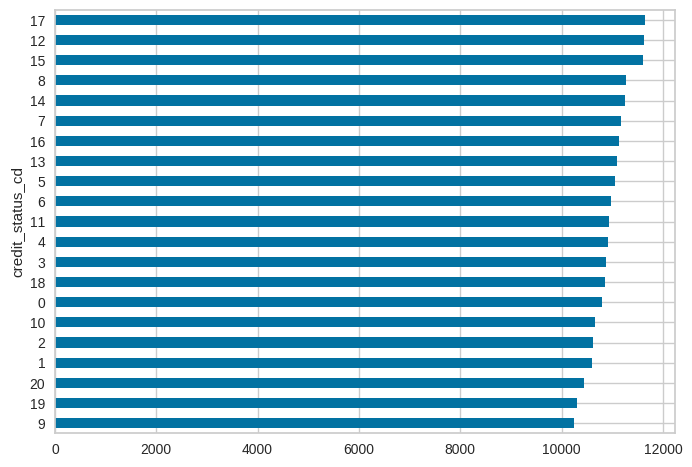

In [ ]:
df.groupby('credit_status_cd')['revenue_usd'].mean().sort_values().plot(kind='barh');

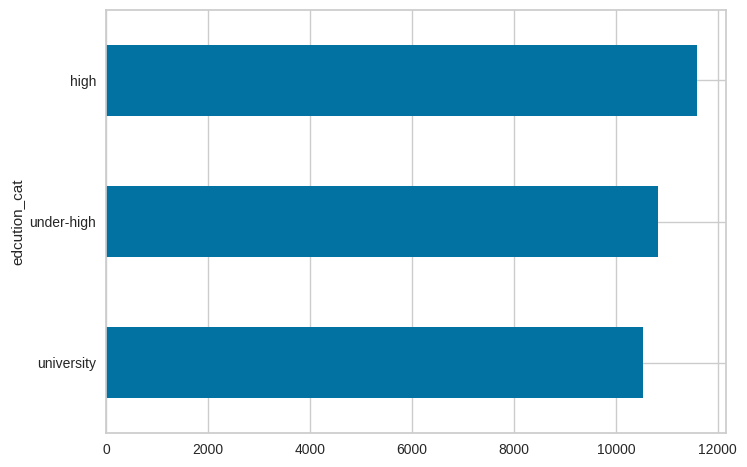

In [ ]:
df.groupby('edcution_cat')['revenue_usd'].mean().sort_values().plot(kind='barh');

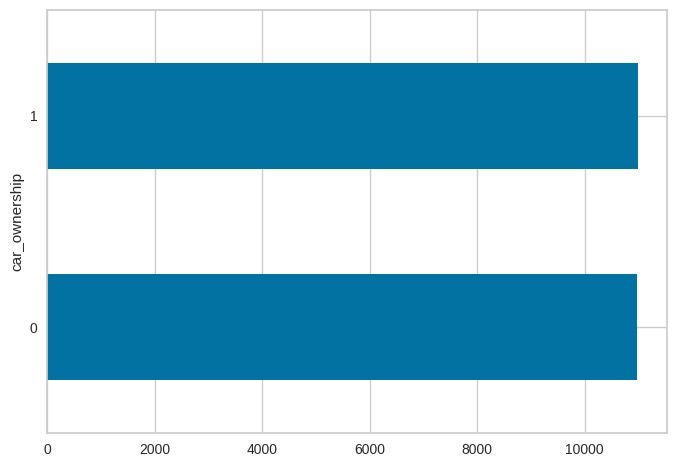

In [ ]:
df.groupby('car_ownership')['revenue_usd'].mean().plot(kind='barh');

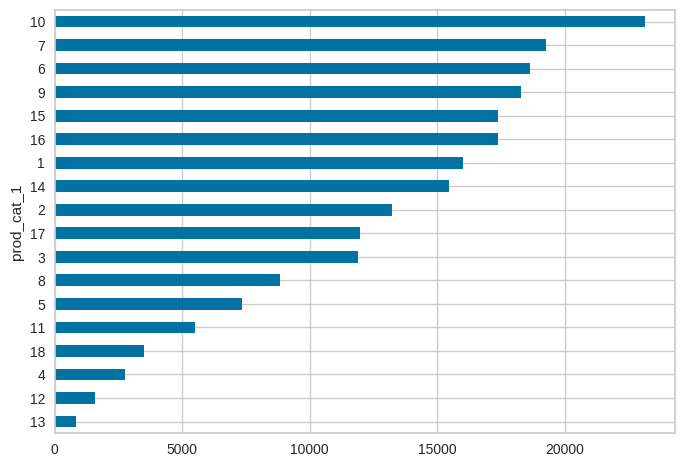

In [ ]:
df.groupby('prod_cat_1')['revenue_usd'].mean().sort_values().plot(kind='barh');

<Axes: xlabel='revenue_usd', ylabel='total_orders'>

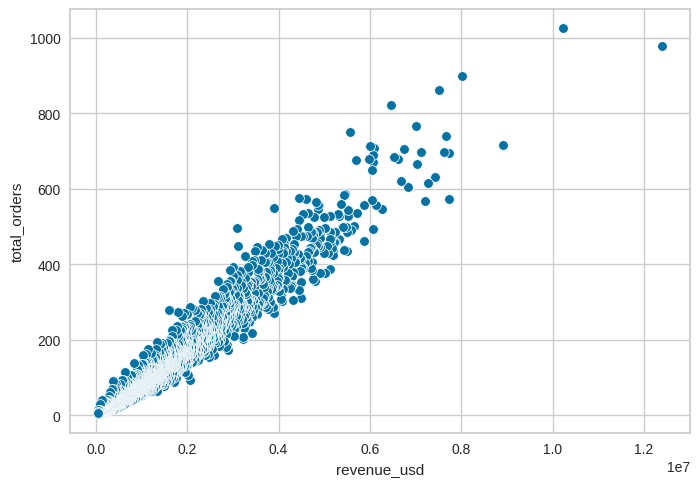

In [ ]:
sns.scatterplot(data=df_agg, x="revenue_usd", y="total_orders")

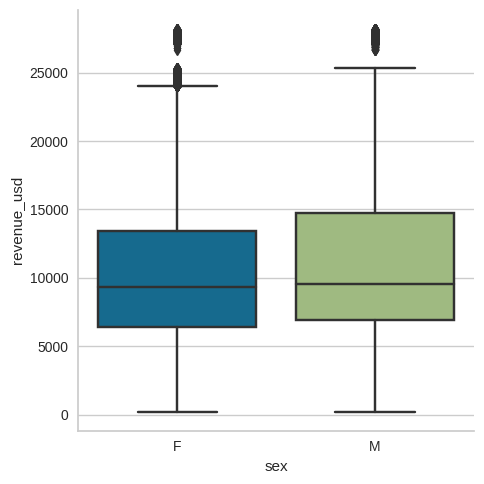

In [ ]:
sns.catplot(data=df, x="sex", y="revenue_usd", kind="box");

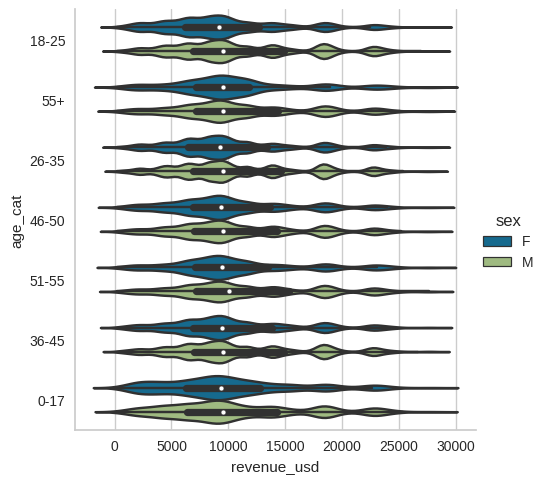

In [ ]:
sns.catplot(
    data=df, x="revenue_usd", y="age_cat", hue="sex", kind="violin",
);

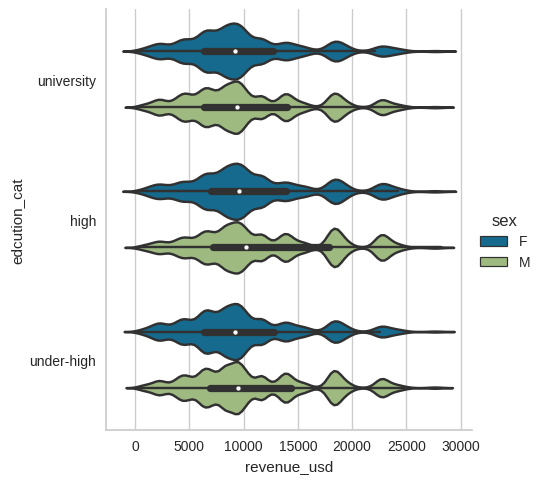

In [ ]:
sns.catplot(
    data=df, x="revenue_usd", y="edcution_cat", hue="sex", kind="violin",);

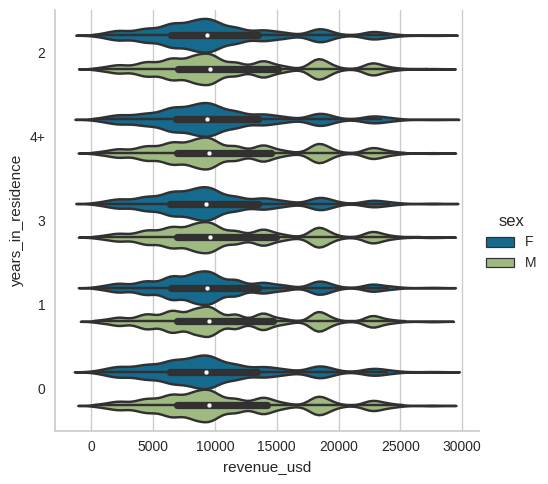

In [ ]:
sns.catplot(data=df, x="revenue_usd", y="years_in_residence", hue="sex", kind="violin",);

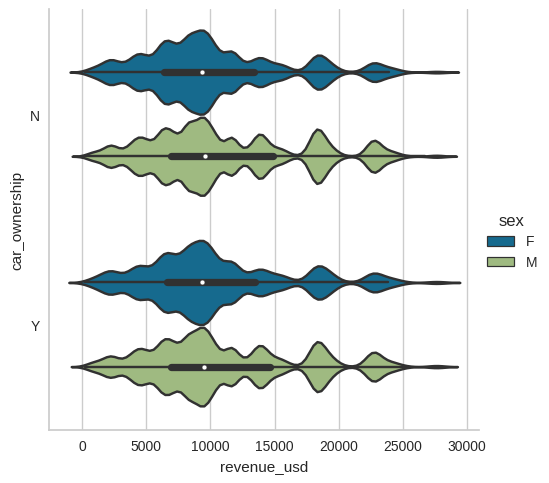

In [ ]:
sns.catplot(data=df, x="revenue_usd", y="car_ownership", hue="sex", kind="violin",);

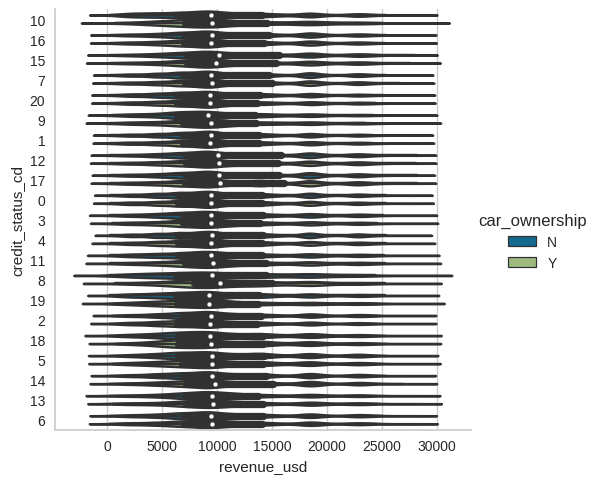

In [ ]:
sns.catplot(data=df, x="revenue_usd", y="credit_status_cd", hue="car_ownership", kind="violin",);

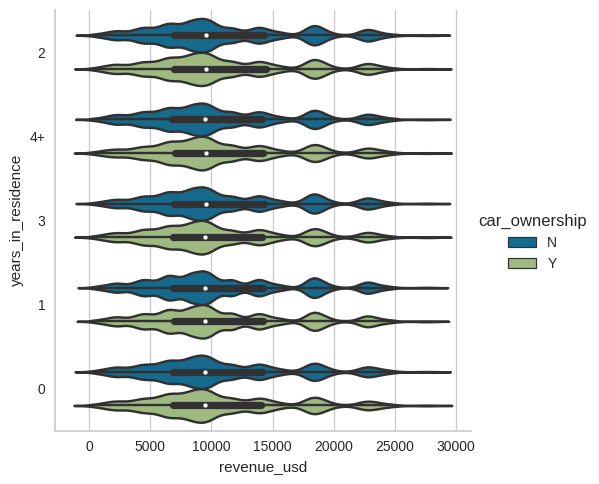

In [ ]:
sns.catplot(data=df, x="revenue_usd", y="years_in_residence", hue="car_ownership", kind="violin",);

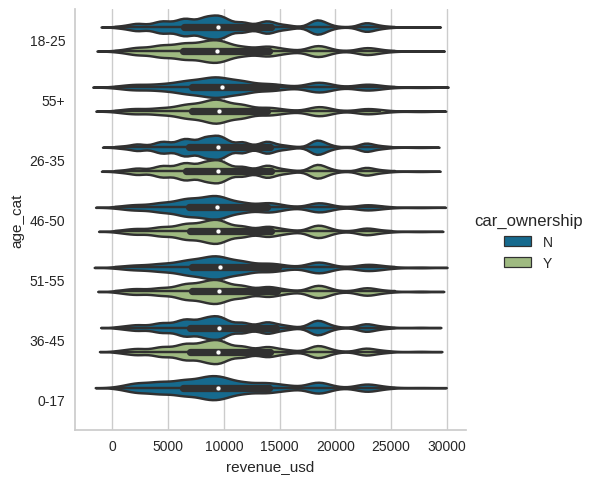

In [ ]:
sns.catplot(data=df, x="revenue_usd", y="age_cat", hue="car_ownership", kind="violin",);

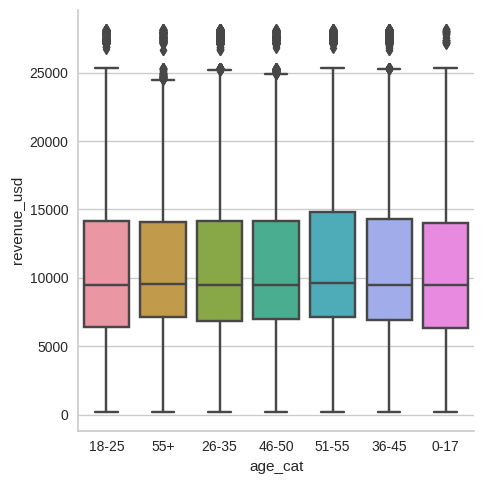

In [ ]:
sns.catplot(data=df, x="age_cat", y="revenue_usd", kind="box");

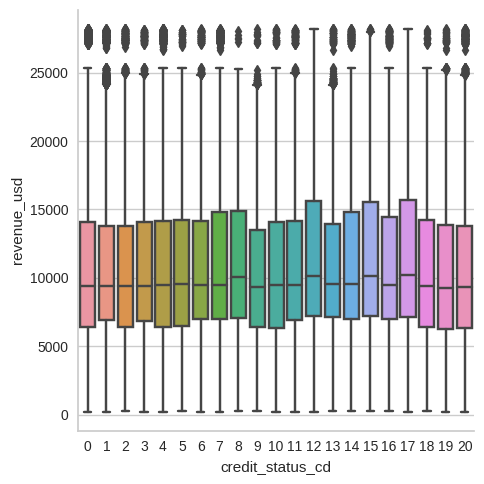

In [ ]:
sns.catplot(data=df, x="credit_status_cd", y="revenue_usd", kind="box");

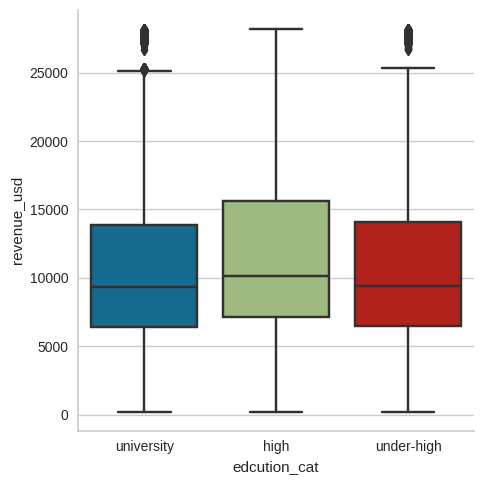

In [ ]:
sns.catplot(data=df, x="edcution_cat", y="revenue_usd", kind="box");

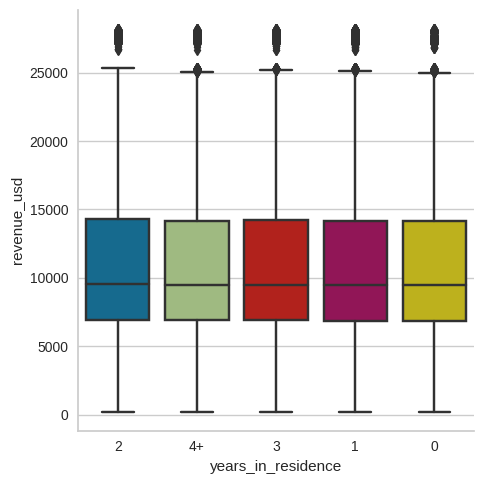

In [ ]:
sns.catplot(data=df, x="years_in_residence", y="revenue_usd", kind="box");

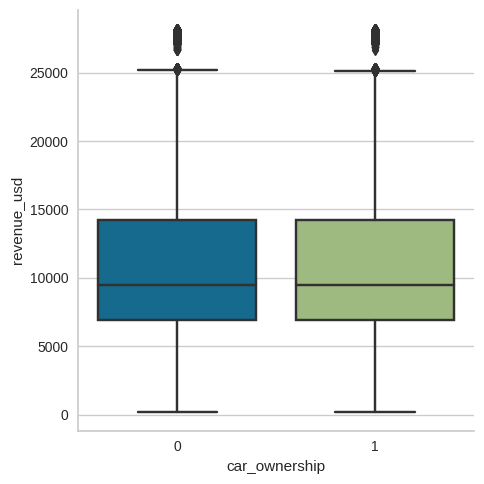

In [ ]:
sns.catplot(data=df, x="car_ownership", y="revenue_usd", kind="box");

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 537577 entries, 0 to 537576
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             537577 non-null  object 
 1   prod_id             537577 non-null  object 
 2   sex                 537577 non-null  object 
 3   age_cat             537577 non-null  object 
 4   credit_status_cd    537577 non-null  int64  
 5   edcution_cat        537577 non-null  object 
 6   years_in_residence  537577 non-null  object 
 7   car_ownership       537577 non-null  int64  
 8   prod_cat_1          537577 non-null  object 
 9   prod_cat_2          537577 non-null  object 
 10  prod_cat_3          537577 non-null  object 
 11  revenue_usd         537577 non-null  float64
 12  total_orders        537577 non-null  int64  
dtypes: float64(1), int64(3), object(9)
memory usage: 57.4+ MB


In [ ]:
df.columns

Index(['user_id', 'prod_id', 'sex', 'age_cat', 'credit_status_cd',
       'edcution_cat', 'years_in_residence', 'car_ownership', 'prod_cat_1',
       'prod_cat_2', 'prod_cat_3', 'revenue_usd', 'total_orders'],
      dtype='object')

In [ ]:
#relationship between revenue and other variables
df.head()

,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd,total_orders
0,DCN-1000001,DSKU-P00069042,F,18-25,10,university,2,0,3,N/A,N/A,9847.06,1
1,DCN-1000001,DSKU-P00248942,F,18-25,10,university,2,0,1,6.0,14.0,17882.35,1
2,DCN-1000001,DSKU-P00087842,F,18-25,10,university,2,0,12,N/A,N/A,1672.94,1
3,DCN-1000001,DSKU-P00085442,F,18-25,10,university,2,0,12,14.0,N/A,1243.53,1
4,DCN-1000002,DSKU-P00285442,M,55+,16,high,4+,0,8,N/A,N/A,9375.29,1


## Approaches to the problem

### Listing the top costumers

In [20]:
# 1st scenario:
# If the campaign doesn't have a specific orientation (e.g.: acessories sale), I can suggest a more generalistic approach (e.g. the goal is to increase revenue based on average tickets customers)
df_agg = pd.DataFrame(df.groupby('user_id')['revenue_usd','total_orders'].sum())
df_agg.reset_index(inplace=True)
df_agg['average_ticket'] = df_agg['revenue_usd'] / df_agg['total_orders']
df_agg

,user_id,revenue_usd,total_orders,average_ticket
0,DCN-1000001,392330.58,34,11539.134706
1,DCN-1000002,953356.46,76,12544.163947
2,DCN-1000003,401923.51,29,13859.431379
3,DCN-1000004,242337.66,13,18641.358462
4,DCN-1000005,965883.53,106,9112.108774
...,...,...,...,...
5886,DCN-1006036,4496077.61,476,9445.541197
5887,DCN-1006037,1264749.40,116,10903.012069
5888,DCN-1006038,95128.22,10,9512.822000
5889,DCN-1006039,652357.65,67,9736.681343


In [21]:
df_agg['total_revenue'] = df_agg['revenue_usd'].sum()
df_agg['revenue_proportion'] = df_agg['revenue_usd'] / df_agg['total_revenue'] *100
df_agg = df_agg.sort_values(by='revenue_proportion', ascending=False)

In [22]:
df_agg['acumulative_proportion'] = np.cumsum(df_agg['revenue_proportion'])
df_agg.reset_index(inplace=True, drop=True)
df_agg

,user_id,revenue_usd,total_orders,average_ticket,total_revenue,revenue_proportion,acumulative_proportion
0,DCN-1004277,12396215.30,978,12675.066769,5.903139e+09,0.209994,0.209994
1,DCN-1001680,10234390.51,1025,9984.771229,5.903139e+09,0.173372,0.383366
2,DCN-1002909,8914711.78,717,12433.349763,5.903139e+09,0.151016,0.534382
3,DCN-1001941,8020580.04,898,8931.603608,5.903139e+09,0.135870,0.670252
4,DCN-1000424,7733657.62,694,11143.598876,5.903139e+09,0.131009,0.801261
...,...,...,...,...,...,...,...
5886,DCN-1004464,54224.70,8,6778.087500,5.903139e+09,0.000919,99.996409
5887,DCN-1005944,54200.00,14,3871.428571,5.903139e+09,0.000918,99.997328
5888,DCN-1005012,53589.41,10,5358.941000,5.903139e+09,0.000908,99.998235
5889,DCN-1005117,52272.93,8,6534.116250,5.903139e+09,0.000886,99.999121


In [23]:
# impact customers approach
# 1362 clients that are responsible for 60% of the revenue_usd
df_agg[df_agg['acumulative_proportion'] <= 60]

,user_id,revenue_usd,total_orders,average_ticket,total_revenue,revenue_proportion,acumulative_proportion
0,DCN-1004277,12396215.30,978,12675.066769,5.903139e+09,0.209994,0.209994
1,DCN-1001680,10234390.51,1025,9984.771229,5.903139e+09,0.173372,0.383366
2,DCN-1002909,8914711.78,717,12433.349763,5.903139e+09,0.151016,0.534382
3,DCN-1001941,8020580.04,898,8931.603608,5.903139e+09,0.135870,0.670252
4,DCN-1000424,7733657.62,694,11143.598876,5.903139e+09,0.131009,0.801261
...,...,...,...,...,...,...,...
1357,DCN-1002338,1390403.55,104,13369.264904,5.903139e+09,0.023554,59.899856
1358,DCN-1000306,1390291.76,112,12413.319286,5.903139e+09,0.023552,59.923408
1359,DCN-1001216,1390158.84,101,13763.948911,5.903139e+09,0.023549,59.946957
1360,DCN-1005596,1389698.78,109,12749.530092,5.903139e+09,0.023542,59.970499


In [24]:
print(df_agg[df_agg['acumulative_proportion'] <= 60]['average_ticket'].mean())
print(df_agg[df_agg['acumulative_proportion'] > 60]['average_ticket'].mean())

11175.515260282138
11557.915450118055


In [25]:
# average ticket approach
# ordering the 1000 with higher average ticket per order
df_agg.sort_values(by='average_ticket', ascending=False).reset_index().loc[:999,:]

,index,user_id,revenue_usd,total_orders,average_ticket,total_revenue,revenue_proportion,acumulative_proportion
0,3924,DCN-1005069,362887.05,16,22680.440625,5.903139e+09,0.006147,92.745236
1,778,DCN-1003902,2054451.79,93,22090.879462,5.903139e+09,0.034803,43.364906
2,3784,DCN-1005999,388502.35,18,21583.463889,5.903139e+09,0.006581,91.852147
3,3348,DCN-1001349,491462.34,23,21367.927826,5.903139e+09,0.008325,88.611642
4,1406,DCN-1000101,1339104.71,65,20601.610923,5.903139e+09,0.022685,61.034714
...,...,...,...,...,...,...,...,...
995,3854,DCN-1002970,378248.25,28,13508.866071,5.903139e+09,0.006408,92.305702
996,1427,DCN-1004810,1323837.69,98,13508.547857,5.903139e+09,0.022426,61.507859
997,3601,DCN-1002009,432247.05,32,13507.720312,5.903139e+09,0.007322,90.581645
998,3533,DCN-1004035,445695.30,33,13505.918182,5.903139e+09,0.007550,90.075748


### Using clustering to customer segmentation

In [26]:
df_agg.head()

,user_id,revenue_usd,total_orders,average_ticket,total_revenue,revenue_proportion,acumulative_proportion
0,DCN-1004277,12396215.30,978,12675.066769,5.903139e+09,0.209994,0.209994
1,DCN-1001680,10234390.51,1025,9984.771229,5.903139e+09,0.173372,0.383366
2,DCN-1002909,8914711.78,717,12433.349763,5.903139e+09,0.151016,0.534382
3,DCN-1001941,8020580.04,898,8931.603608,5.903139e+09,0.135870,0.670252
4,DCN-1000424,7733657.62,694,11143.598876,5.903139e+09,0.131009,0.801261


In [27]:
# 2nd scenario:
# If the campaign has a product/product categorie related goal, like "sell more notebooks Dell Inspiron A15", I can offer an approach of lookalike audience base on clistering techniques
df_knn = df_agg[['user_id','revenue_usd','total_orders']]
df_knn.head()

,user_id,revenue_usd,total_orders
0,DCN-1004277,12396215.30,978
1,DCN-1001680,10234390.51,1025
2,DCN-1002909,8914711.78,717
3,DCN-1001941,8020580.04,898
4,DCN-1000424,7733657.62,694


In [28]:
# transform data scales
# how we dont't have too many outliers on those data, I'm going to use the MixMax scaler
scaler = MinMaxScaler()
df_knn['revenue_usd_scaled'] = scaler.fit_transform(df_knn['revenue_usd'].values.reshape(-1,1))
df_knn['total_orders_scaled'] = scaler.fit_transform(df_knn['total_orders'].values.reshape(-1,1))
df_knn.head()

,user_id,revenue_usd,total_orders,revenue_usd_scaled,total_orders_scaled
0,DCN-1004277,12396215.30,978,1.000000,0.953922
1,DCN-1001680,10234390.51,1025,0.824873,1.000000
2,DCN-1002909,8914711.78,717,0.717967,0.698039
3,DCN-1001941,8020580.04,898,0.645535,0.875490
4,DCN-1000424,7733657.62,694,0.622291,0.675490


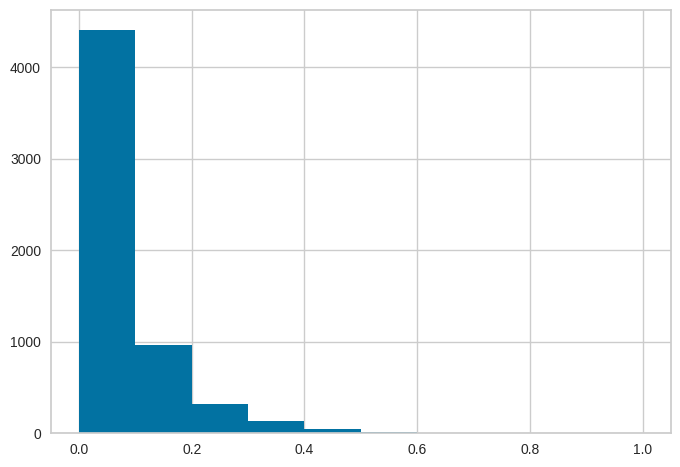

In [ ]:
df_knn['revenue_usd_scaled'].hist();

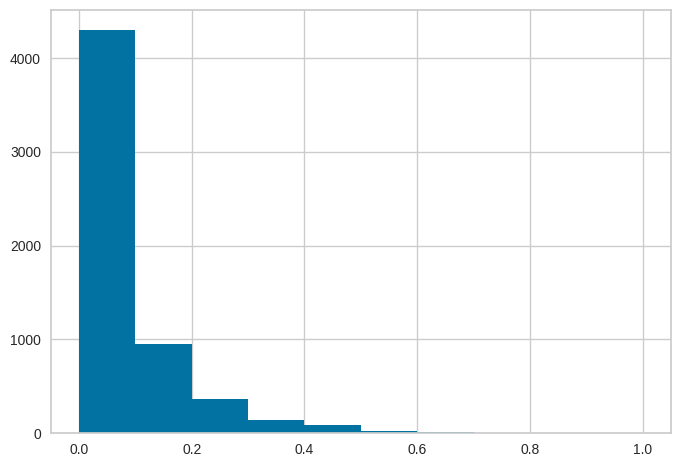

In [ ]:
df_knn['total_orders_scaled'].hist();

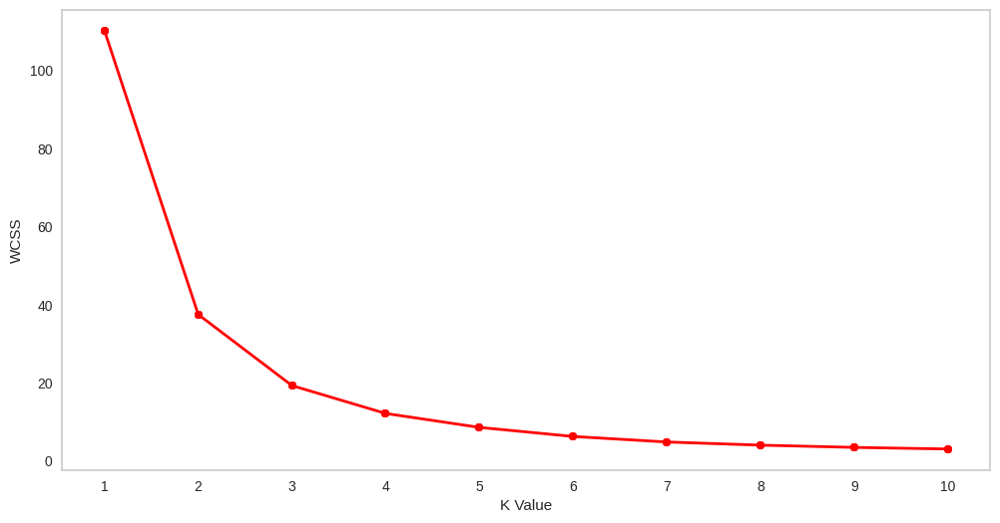

In [ ]:
wcss = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, init="k-means++")
    kmeans.fit(df_kmeans.iloc[:,-2:])
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))
plt.grid()
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()

In [ ]:
km = KMeans(n_clusters=5)
clusters = km.fit_predict(df_kmeans.iloc[:,-2:])
df_kmeans["label"] = clusters
df_kmeans

,user_id,revenue_usd,total_orders,revenue_usd_scaled,total_orders_scaled,label
0,DCN-1004277,12396215.30,978,1.000000,0.953922,4
1,DCN-1001680,10234390.51,1025,0.824873,1.000000,4
2,DCN-1002909,8914711.78,717,0.717967,0.698039,4
3,DCN-1001941,8020580.04,898,0.645535,0.875490,4
4,DCN-1000424,7733657.62,694,0.622291,0.675490,4
...,...,...,...,...,...,...
5886,DCN-1004464,54224.70,8,0.000189,0.002941,0
5887,DCN-1005944,54200.00,14,0.000187,0.008824,0
5888,DCN-1005012,53589.41,10,0.000138,0.004902,0
5889,DCN-1005117,52272.93,8,0.000031,0.002941,0


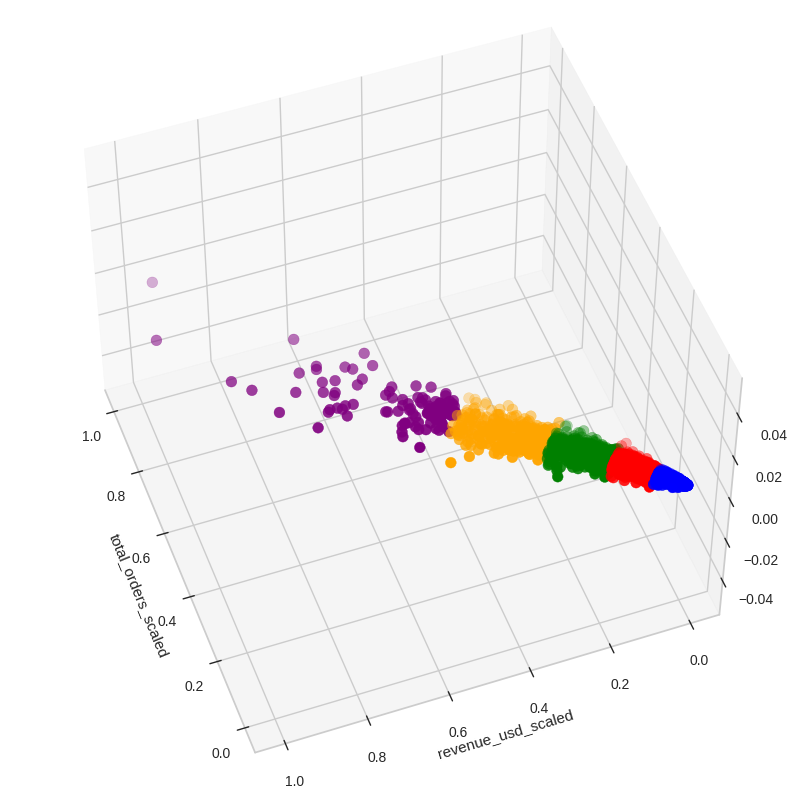

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_kmeans.revenue_usd_scaled[df_kmeans.label == 0], df_kmeans.total_orders_scaled[df_kmeans.label == 0], c='blue', s=60)
ax.scatter(df_kmeans.revenue_usd_scaled[df_kmeans.label == 1], df_kmeans.total_orders_scaled[df_kmeans.label == 1], c='red', s=60)
ax.scatter(df_kmeans.revenue_usd_scaled[df_kmeans.label == 2], df_kmeans.total_orders_scaled[df_kmeans.label == 2], c='green', s=60)
ax.scatter(df_kmeans.revenue_usd_scaled[df_kmeans.label == 3], df_kmeans.total_orders_scaled[df_kmeans.label == 3], c='orange', s=60)
ax.scatter(df_kmeans.revenue_usd_scaled[df_kmeans.label == 4], df_kmeans.total_orders_scaled[df_kmeans.label == 4], c='purple', s=60)
ax.view_init(50, 160)
plt.xlabel("total_orders_scaled")
plt.ylabel("revenue_usd_scaled")
plt.show()

In [ ]:
df_kmeans.head()

,user_id,revenue_usd,total_orders,revenue_usd_scaled,total_orders_scaled,label
0,DCN-1004277,12396215.30,978,1.000000,0.953922,4
1,DCN-1001680,10234390.51,1025,0.824873,1.000000,4
2,DCN-1002909,8914711.78,717,0.717967,0.698039,4
3,DCN-1001941,8020580.04,898,0.645535,0.875490,4
4,DCN-1000424,7733657.62,694,0.622291,0.675490,4


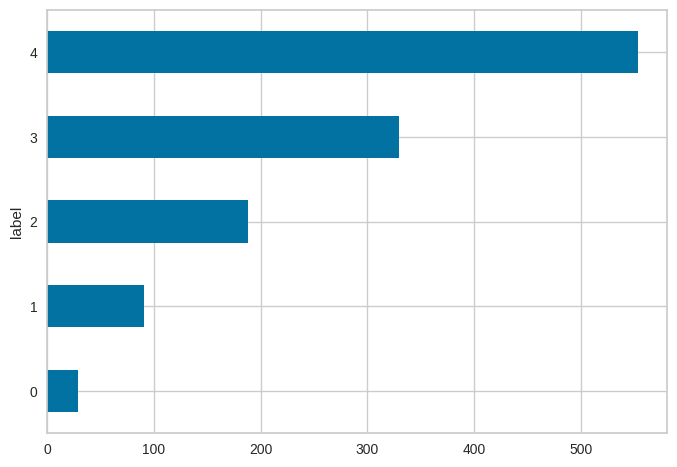

In [ ]:
df_kmeans.groupby('label')['total_orders'].mean().plot(kind='barh');

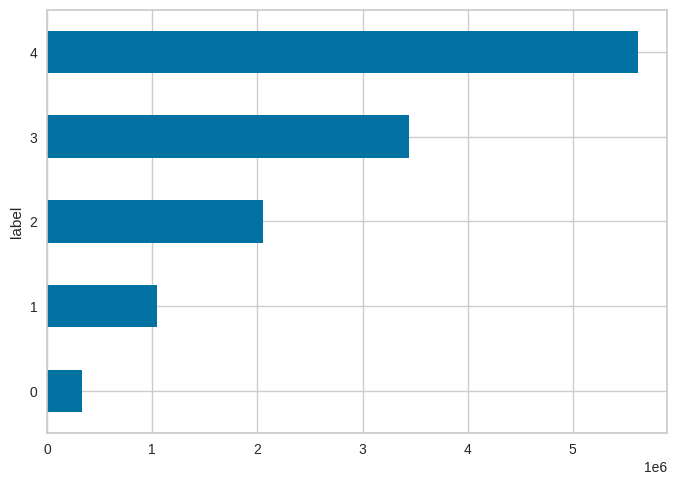

In [ ]:
df_kmeans.groupby('label')['revenue_usd'].mean().plot(kind='barh');

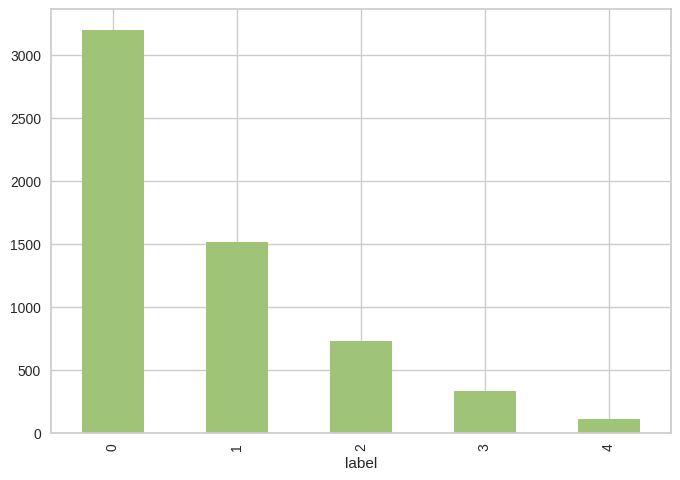

In [ ]:
df_kmeans.groupby('label')['user_id'].count().plot(kind='bar', color='g');

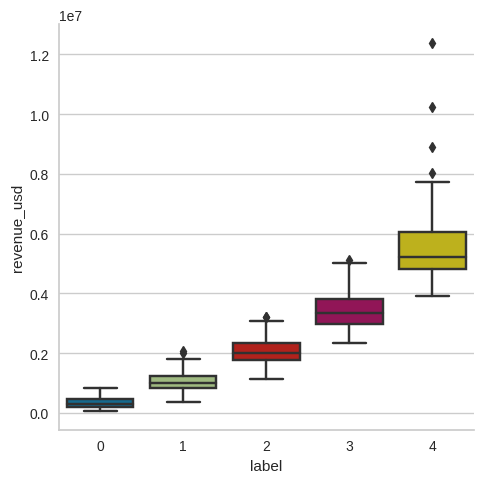

In [ ]:
sns.catplot(data=df_kmeans, x="label", y="revenue_usd", kind="box");

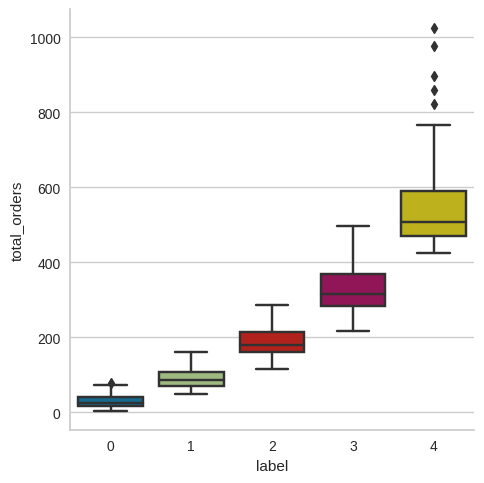

In [ ]:
sns.catplot(data=df_kmeans, x="label", y="total_orders", kind="box");

### Decision Three

In [ ]:
# instalando libs
!pip install pycaret
!pip install shap
!pip install pycaret[analysis]

In [30]:
import scipy.stats as stats
from scipy.stats import *
from pycaret.classification import *
from pycaret.regression import *
from ipywidgets import widgets
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file

In [ ]:
# 3rd scenario:
# Run a classification using decision three


In [31]:
df_agg.head()

,user_id,revenue_usd,total_orders,average_ticket,total_revenue,revenue_proportion,acumulative_proportion
0,DCN-1004277,12396215.30,978,12675.066769,5.903139e+09,0.209994,0.209994
1,DCN-1001680,10234390.51,1025,9984.771229,5.903139e+09,0.173372,0.383366
2,DCN-1002909,8914711.78,717,12433.349763,5.903139e+09,0.151016,0.534382
3,DCN-1001941,8020580.04,898,8931.603608,5.903139e+09,0.135870,0.670252
4,DCN-1000424,7733657.62,694,11143.598876,5.903139e+09,0.131009,0.801261


In [32]:
df.head()

,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,prod_cat_2,prod_cat_3,revenue_usd,total_orders
0,DCN-1000001,DSKU-P00069042,F,18-25,10x,university,2,N,3x,N/A,N/A,9847.06,1
1,DCN-1000001,DSKU-P00248942,F,18-25,10x,university,2,N,1x,6.0,14.0,17882.35,1
2,DCN-1000001,DSKU-P00087842,F,18-25,10x,university,2,N,12x,N/A,N/A,1672.94,1
3,DCN-1000001,DSKU-P00085442,F,18-25,10x,university,2,N,12x,14.0,N/A,1243.53,1
4,DCN-1000002,DSKU-P00285442,M,55+,16x,high,4+,N,8x,N/A,N/A,9375.29,1


In [ ]:
df[['user_id','sex','age_cat','credit_status_cd','edcution_cat','years_in_residence','car_ownership']].drop_duplicates()

,user_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership
0,DCN-1000001,F,18-25,10,university,2,N
4,DCN-1000002,M,55+,16,high,4+,N
5,DCN-1000003,M,26-35,15,university,3,N
6,DCN-1000004,M,46-50,7,under-high,2,Y
9,DCN-1000005,M,26-35,20,university,1,Y
...,...,...,...,...,...,...,...
233801,DCN-1000019,M,55+,10,university,3,N
241163,DCN-1001187,F,55+,0,university,2,N
243533,DCN-1001529,M,18-25,4,high,4+,Y
324454,DCN-1001929,F,0-17,10,university,0,N


In [33]:
df[['user_id','prod_id','sex','age_cat','credit_status_cd',
    'edcution_cat','years_in_residence','car_ownership','prod_cat_1']].drop_duplicates()

,user_id,prod_id,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1
0,DCN-1000001,DSKU-P00069042,F,18-25,10x,university,2,N,3x
1,DCN-1000001,DSKU-P00248942,F,18-25,10x,university,2,N,1x
2,DCN-1000001,DSKU-P00087842,F,18-25,10x,university,2,N,12x
3,DCN-1000001,DSKU-P00085442,F,18-25,10x,university,2,N,12x
4,DCN-1000002,DSKU-P00285442,M,55+,16x,high,4+,N,8x
...,...,...,...,...,...,...,...,...,...
537572,DCN-1004737,DSKU-P00193542,M,36-45,16x,high,1,N,1x
537573,DCN-1004737,DSKU-P00111142,M,36-45,16x,high,1,N,1x
537574,DCN-1004737,DSKU-P00345942,M,36-45,16x,high,1,N,8x
537575,DCN-1004737,DSKU-P00285842,M,36-45,16x,high,1,N,5x


In [42]:
data = pd.merge(df_agg[['user_id','revenue_usd']],
                df[['user_id','sex','age_cat','credit_status_cd',
                'edcution_cat','years_in_residence','car_ownership','prod_cat_1']].drop_duplicates())
data.head()

,user_id,revenue_usd,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1
0,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,5x
1,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,6x
2,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,2x
3,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,1x
4,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,8x


In [35]:
data['revenue_range'] = pd.qcut(data['revenue_usd'], 5)
data.head()

,user_id,revenue_usd,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1,revenue_range
0,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,5x,"(2122178.72, 12396215.3]"
1,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,6x,"(2122178.72, 12396215.3]"
2,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,2x,"(2122178.72, 12396215.3]"
3,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,1x,"(2122178.72, 12396215.3]"
4,DCN-1004277,12396215.3,M,36-45,16x,university,0,N,8x,"(2122178.72, 12396215.3]"


In [36]:
data.groupby('revenue_range')['user_id'].count()

revenue_range
(51891.769, 334033.876]     10516
(334033.876, 674557.65]     10517
(674557.65, 1162869.39]     10517
(1162869.39, 2122178.72]    10522
(2122178.72, 12396215.3]    10507
Name: user_id, dtype: int64

In [44]:
data.drop(columns=['user_id'],inplace=True)
data.head()

,revenue_usd,sex,age_cat,credit_status_cd,edcution_cat,years_in_residence,car_ownership,prod_cat_1
0,12396215.3,M,36-45,16x,university,0,N,5x
1,12396215.3,M,36-45,16x,university,0,N,6x
2,12396215.3,M,36-45,16x,university,0,N,2x
3,12396215.3,M,36-45,16x,university,0,N,1x
4,12396215.3,M,36-45,16x,university,0,N,8x


In [45]:
s = setup(data, target = 'revenue_usd', session_id = 42)

,Description,Value
0,Session id,42
1,Target,revenue_usd
2,Target type,Regression
3,Original data shape,"(52579, 8)"
4,Transformed data shape,"(52579, 57)"
5,Transformed train set shape,"(36805, 57)"
6,Transformed test set shape,"(15774, 57)"
7,Ordinal features,2
8,Categorical features,7
9,Preprocess,True


In [46]:
best_model = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,671281.5062,898623799296.0000,947667.7688,0.4585,0.8409,1.1634,10.0950
lightgbm,Light Gradient Boosting Machine,731250.6894,1029759291873.9750,1014505.4639,0.3795,0.8821,1.2798,2.3640
knn,K Neighbors Regressor,723306.5312,1088846220492.8000,1043126.7625,0.3436,0.8876,1.2432,1.6020
rf,Random Forest Regressor,708805.2954,1131118242616.7893,1063016.8856,0.3187,0.8767,1.1914,19.5850
gbr,Gradient Boosting Regressor,788720.4013,1225596401969.2927,1106788.4633,0.2617,0.9204,1.3694,4.5580
br,Bayesian Ridge,804016.7328,1267201131822.3542,1125388.5449,0.2368,0.9610,1.3838,0.7380
lar,Least Angle Regression,804197.4628,1267281844452.4927,1125424.3340,0.2367,0.9600,1.3831,0.4730
llar,Lasso Least Angle Regression,804195.9194,1267280312587.7727,1125423.6541,0.2367,0.9600,1.3831,0.5340
ridge,Ridge Regression,804188.2594,1267275583571.8757,1125421.5573,0.2367,0.9601,1.3831,0.4620
lasso,Lasso Regression,804195.8611,1267280149426.1074,1125423.5845,0.2367,0.9600,1.3831,4.2860


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

In [47]:
evaluate_model(best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

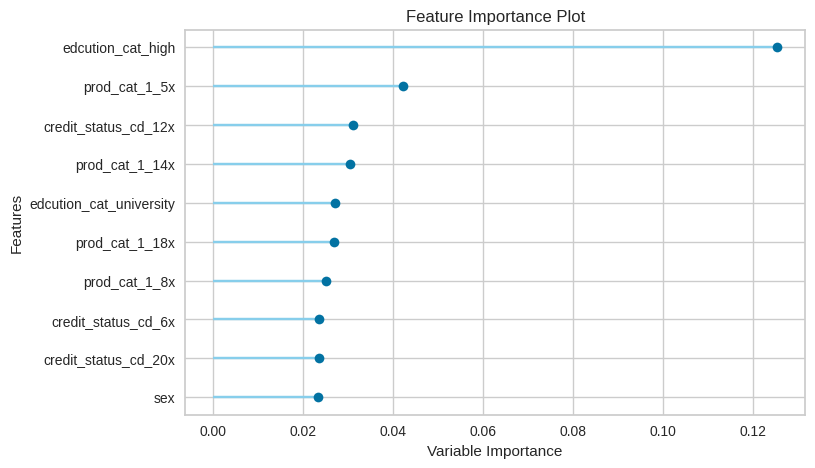

In [48]:
plot_model(best_model, plot = 'feature')

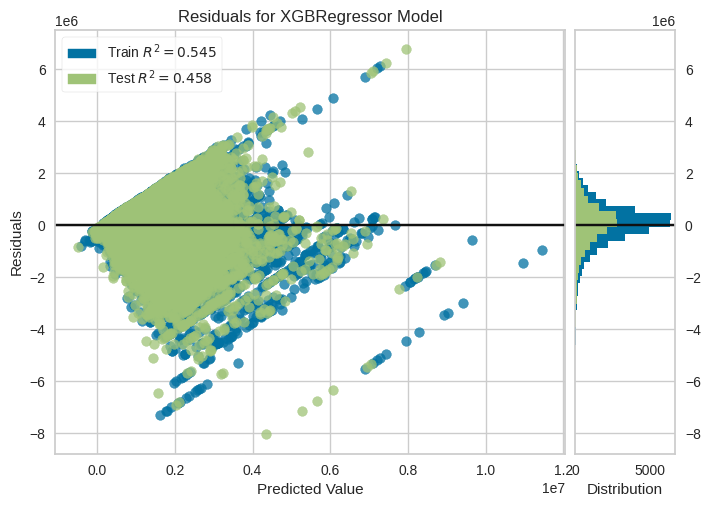

In [49]:
plot_model(best_model, plot = 'residuals')